In [1]:
import os
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.formula.api as smf

from argparse import Namespace
from glob import glob

from sklearn.decomposition import PCA

import seaborn as sns
sns.set()

In [2]:
from maskrcnn.postprocess.validate import L, gini, plot_scatter

In [3]:
import matplotlib
matplotlib.rc('pdf', fonttype=42)

In [4]:
def gini_series(x): return gini(x.values)

In [5]:
# image index data
IDX_IN_DIR = 'data/Experiment0/aoi.csv'
# download log data
LOG_IN_DIR = 'data/Experiment0/aoi_download_log.csv'

# census data
CEN_IN_DIR = 'data/Experiment0/census.csv'

# satellite derived data
SAT_IN_DIR = 'data/Mexico/Pred/infer/'

# output path
OUT_DIR = 'data/Experiment0/Output/'

SAMPLE_NAME = '2019Oct9'

# set up visualization cfg
cfg = Namespace()
cfg.visual_score_cutoff = 0.9
cfg.xmax = 480
cfg.ymax = 770

In [6]:
# renamed columns in census, translate to English
CEN_COLS = {
    'POBTOT': 'cen_pop',
    'VIVTOT': 'cen_house',
    'TVIVHAB': 'cen_inhab',
    'asset_score1': 'cen_asset_score1',
    'asset_score2': 'cen_asset_score2',
    'asset_score3': 'cen_asset_score3',
    'VPH_SNBIEN': 'cen_nodurable',
    'VPH_1CUART': 'cen_1room',
    'VPH_3YMASC': 'cen_3plusroom',
    'VPH_REFRI': 'cen_refri',
    'VPH_AUTOM': 'cen_autom',
    'VPH_C_ELEC': 'cen_elec',
    'VPH_PISODT': 'cen_floor',
    'VPH_AGUADV': 'cen_water',
    'VPH_EXCSA': 'cen_toilet',
    'VPH_DRENAJ': 'cen_drainage',
    'VPH_INTER': 'cen_internet'
}

In [7]:
# read image index data frame
df_idx = pd.merge(pd.read_csv(IDX_IN_DIR),
                  pd.read_csv(LOG_IN_DIR),
                  how='outer', on='index')
df_idx = df_idx.loc[:, ['index', 'ent', 'mun', 'loc', 'chip',
                        'status', 'lon_min', 'lon_max', 'lat_min', 'lat_max']]

In [8]:
# read census data
df_cen = pd.read_csv(CEN_IN_DIR)

# drop NA localities with no images
df_cen = pd.merge(
    df_cen,
    df_idx.groupby(['ent', 'mun', 'loc']).agg(
        no_missing=pd.NamedAgg(column='status',
                               aggfunc=lambda x: sum(pd.isna(x)))),
    how='outer',
    on=['ent', 'mun', 'loc'])
df_cen = df_cen.loc[df_cen['no_missing'] == 0, :]

In [9]:
# compute asset score
vph_cols = [col for col in df_cen.columns if col.startswith('VPH')]
m = PCA(n_components=3)
df_cen = pd.concat([
    df_cen.reset_index(drop=True),
    pd.DataFrame(m.fit_transform(df_cen.loc[:, vph_cols].values),
                 columns=['asset_score1', 'asset_score2', 'asset_score3'])],
    axis=1)
df_cen['asset_score1'] = - df_cen['asset_score1']

In [10]:
# # rename and select columns
# df_cen = (df_cen.loc[:, ['ent', 'mun', 'loc', 'sample'] + list(CEN_COLS.keys())]
#                 .rename(columns=CEN_COLS))

In [11]:
# read satellite predictions
# from json annotations
df_sat = []
for file_name in glob(SAT_IN_DIR + '*.json'):
    with open(file_name, 'r') as f:
        df_sat += json.load(f)
df_sat = pd.DataFrame(df_sat)

# drop low score predictions
df_sat = df_sat.loc[df_sat['score'] > cfg.visual_score_cutoff, :]

# drop predictions on logos
df_sat = pd.concat([
    df_sat.reset_index(drop=True),
    pd.DataFrame(df_sat['bbox'].values.tolist(),
                 columns=['xmin', 'ymin', 'width', 'height'])],
    axis=1)
df_sat = df_sat.loc[~((df_sat['xmin'] > cfg.xmax) & (df_sat['ymin'] > cfg.ymax)), :]

In [12]:
# merge with locality identifiers
df_sat = pd.merge(df_idx, df_sat,
                  how='right', left_on='index', right_on='image_id_str')

In [13]:
# calculate centroid
# remember that the lon/lat min/max are the chip bbox, not the instance bbox
# the following is instance centroid
df_sat['lon_center'] = (df_sat['lon_min'] +
    (df_sat['xmin'] + df_sat['width'] / 2) / 800 *
    (df_sat['lon_max'] - df_sat['lon_min']))
df_sat['lat_center'] = (df_sat['lat_max'] -
    (df_sat['ymin'] + df_sat['height'] / 2) / 800 *
    (df_sat['lat_max'] - df_sat['lat_min']))

In [14]:
# grouping into localities
df_group = df_sat.groupby(['ent', 'mun', 'loc']).agg(
    sat_house=pd.NamedAgg(column='score', aggfunc='count'),
    sat_size_mean=pd.NamedAgg(column='area', aggfunc=np.nanmean),
    sat_size_gini=pd.NamedAgg(column='area', aggfunc=gini_series),
    sat_size_sum=pd.NamedAgg(column='area', aggfunc=np.nansum)
)

In [15]:
# calculate K function values
tile_size = 1.6516e-3
for i, col in zip([.05, .1, .15, .3, .5],
                  ['sat_dist_h05', 'sat_dist_h10', 'sat_dist_h15',
                   'sat_dist_h30', 'sat_dist_h50']):
    df_group[col] = df_sat.groupby(['ent', 'mun', 'loc']).apply(
        lambda grp: L(grp[['lon_center', 'lat_center']].values,
                      A=(tile_size ** 2) * 25, h=tile_size * i))

# scale areas / distances
df_group[['sat_size_mean', 'sat_size_sum']] *= (
    ((tile_size / 800 * 111000) ** 2) * np.cos(23 / 180 * np.pi))  # in sq meters

In [16]:
def n_neighbor(coords, h):
    return (cdist(coords, coords, 'euclidean') < h).sum(axis=0).mean()

In [17]:
from scipy.spatial.distance import cdist

In [18]:
for i, col in zip([.05, .1, .15, .3, .5],
                  ['sat_nn_h05', 'sat_nn_h10', 'sat_nn_h15',
                   'sat_nn_h30', 'sat_nn_h50']):
    df_group[col] = df_sat.groupby(['ent', 'mun', 'loc']).apply(
        lambda grp: n_neighbor(
            grp[['lon_center', 'lat_center']].values,
            h=tile_size * i))

In [19]:
# drop outliers
df_group = df_group.loc[
    ((df_group['sat_size_mean'] <= df_group['sat_size_mean'].quantile(q=0.97)) &
     (df_group['sat_house'] <= df_group['sat_house'].quantile(q=0.97))), :]

In [20]:
# merge satellite and census
df_group = pd.merge(
    df_group,
    df_cen,
    how='inner', on=['ent', 'mun', 'loc'])

In [21]:
# fig, ax = plt.subplots(figsize=(9, 6))
# sns.heatmap(df_group.drop(columns=['sample', 'no_missing']).corr(), annot=False, linewidths=.5, ax=ax)

In [22]:
df_group.columns

Index(['ent', 'mun', 'loc', 'sat_house', 'sat_size_mean', 'sat_size_gini',
       'sat_size_sum', 'sat_dist_h05', 'sat_dist_h10', 'sat_dist_h15',
       'sat_dist_h30', 'sat_dist_h50', 'sat_nn_h05', 'sat_nn_h10',
       'sat_nn_h15', 'sat_nn_h30', 'sat_nn_h50', 'LONGITUD', 'LATITUD',
       'POBTOT', 'VIVTOT', 'TVIVHAB', 'VPH_PISODT', 'VPH_PISOTI', 'VPH_1DOR',
       'VPH_2YMASD', 'VPH_1CUART', 'VPH_2CUART', 'VPH_3YMASC', 'VPH_C_ELEC',
       'VPH_S_ELEC', 'VPH_AGUADV', 'VPH_AGUAFV', 'VPH_EXCSA', 'VPH_DRENAJ',
       'VPH_NODREN', 'VPH_C_SERV', 'VPH_SNBIEN', 'VPH_RADIO', 'VPH_TV',
       'VPH_REFRI', 'VPH_LAVAD', 'VPH_AUTOM', 'VPH_PC', 'VPH_TELEF', 'VPH_CEL',
       'VPH_INTER', 'TAM_LOC', 'lon', 'lat', 'asset_score', 'sample',
       'no_missing', 'asset_score1', 'asset_score2', 'asset_score3'],
      dtype='object')

In [23]:
smf.ols('VPH_C_ELEC ~ sat_nn_h50', data=df_group).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             VPH_C_ELEC   R-squared:                       0.166
Model:                            OLS   Adj. R-squared:                  0.161
Method:                 Least Squares   F-statistic:                     36.50
Date:                Thu, 14 Nov 2019   Prob (F-statistic):           8.29e-09
Time:                        00:11:48   Log-Likelihood:                -75.872
No. Observations:                 186   AIC:                             155.7
Df Residuals:                     184   BIC:                             162.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.4365      0.047      9.265      0.000       0.344       0.529
sat_nn_h50     0.0367      0.006      6.041      0.000       0.025       0.049
==============================================================================
Omnibus:                       19.191   Durbin-Watson:                   1.706
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               18.655
Skew:                          -0.713   Prob(JB):                     8.89e-05
Kurtosis:                       2.388   Cond. No.                         13.8
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [24]:
smf.ols('VPH_C_ELEC ~ sat_nn_h30 + POBTOT', data=df_group).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             VPH_C_ELEC   R-squared:                       0.183
Model:                            OLS   Adj. R-squared:                  0.174
Method:                 Least Squares   F-statistic:                     20.46
Date:                Thu, 14 Nov 2019   Prob (F-statistic):           9.57e-09
Time:                        00:11:48   Log-Likelihood:                -73.932
No. Observations:                 186   AIC:                             153.9
Df Residuals:                     183   BIC:                             163.5
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.4067      0.057      7.164      0.000       0.295       0.519
sat_nn_h30     0.0591      0.017      3.558      0.000       0.026       0.092
POBTOT         0.0003      0.000      2.985      0.003       0.000       0.001
==============================================================================
Omnibus:                       29.307   Durbin-Watson:                   1.741
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               17.268
Skew:                          -0.600   Prob(JB):                     0.000178
Kurtosis:                       2.111   Cond. No.                         787.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [25]:
smf.ols('VPH_C_ELEC ~ sat_nn_h15 + sat_house', data=df_group).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             VPH_C_ELEC   R-squared:                       0.188
Model:                            OLS   Adj. R-squared:                  0.179
Method:                 Least Squares   F-statistic:                     21.21
Date:                Thu, 14 Nov 2019   Prob (F-statistic):           5.20e-09
Time:                        00:11:49   Log-Likelihood:                -73.312
No. Observations:                 186   AIC:                             152.6
Df Residuals:                     183   BIC:                             162.3
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.4428      0.100      4.420      0.000       0.245       0.640
sat_nn_h15     0.0478      0.066      0.723      0.470      -0.083       0.178
sat_house      0.0025      0.001      4.407      0.000       0.001       0.004
==============================================================================
Omnibus:                       53.623   Durbin-Watson:                   1.761
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               17.742
Skew:                          -0.530   Prob(JB):                     0.000140
Kurtosis:                       1.919   Cond. No.                         383.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [26]:
smf.ols('VPH_AGUADV ~ sat_nn_h50 + sat_house', data=df_group).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             VPH_AGUADV   R-squared:                       0.086
Model:                            OLS   Adj. R-squared:                  0.076
Method:                 Least Squares   F-statistic:                     8.609
Date:                Thu, 14 Nov 2019   Prob (F-statistic):           0.000267
Time:                        00:11:50   Log-Likelihood:                -93.051
No. Observations:                 186   AIC:                             192.1
Df Residuals:                     183   BIC:                             201.8
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.3715      0.053      6.971      0.000       0.266       0.477
sat_nn_h50    -0.0044      0.012     -0.384      0.701      -0.027       0.018
sat_house      0.0022      0.001      2.705      0.007       0.001       0.004
==============================================================================
Omnibus:                     3271.907   Durbin-Watson:                   1.526
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               18.369
Skew:                           0.052   Prob(JB):                     0.000103
Kurtosis:                       1.464   Cond. No.                         157.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [27]:
smf.ols('VPH_AGUADV ~ sat_nn_h50 + sat_house', data=df_group).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             VPH_AGUADV   R-squared:                       0.086
Model:                            OLS   Adj. R-squared:                  0.076
Method:                 Least Squares   F-statistic:                     8.609
Date:                Thu, 14 Nov 2019   Prob (F-statistic):           0.000267
Time:                        00:11:50   Log-Likelihood:                -93.051
No. Observations:                 186   AIC:                             192.1
Df Residuals:                     183   BIC:                             201.8
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.3715      0.053      6.971      0.000       0.266       0.477
sat_nn_h50    -0.0044      0.012     -0.384      0.701      -0.027       0.018
sat_house      0.0022      0.001      2.705      0.007       0.001       0.004
==============================================================================
Omnibus:                     3271.907   Durbin-Watson:                   1.526
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               18.369
Skew:                           0.052   Prob(JB):                     0.000103
Kurtosis:                       1.464   Cond. No.                         157.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [28]:
import os
import pandas as pd
from argparse import Namespace

from maskrcnn.postprocess.resample import Resampler

# set up visualization cfg
cfg = Namespace()
cfg.int_dict = {1: 'house'}
cfg.visual_score_cutoff = 0.8
cfg.font = 'maskrcnn/utils/fonts/UbuntuMono-B.ttf'
cfg.bbox_outline = [255, 255, 255, 255]  # white
cfg.bbox_width = 1  # in pixels
cfg.label_fill = [255, 255, 255, 255]  # white
cfg.up_scale = 1
cfg.font_size = 14
cfg.category_palette = {
    1: [255, 140, 105, 0]  # salmon
}
cfg.xmax = 480
cfg.ymax = 770

# AOI index data w/ georeferencing info
AOI_IN_DIR = 'data/Experiment0/aoi.csv'
# download log data
LOG_IN_DIR = 'data/Experiment0/aoi_download_log.csv'
# census data
CEN_IN_DIR = 'data/Experiment0/census.csv'
# satellite images
IMG_IN_DIR = 'data/Mexico/Image/'
# satellite derived annotations
ANN_IN_DIR = 'data/Mexico/Pred/infer/'
# output path
OUT_DIR = 'data/Experiment0/Output/'

# number of visualizations
N_VIZ = 10

# read image index data frame
df = pd.merge(pd.read_csv(AOI_IN_DIR),
              pd.read_csv(LOG_IN_DIR).loc[:, 'index'],
              how='right', on='index')
# read census data
df_cen = pd.read_csv(CEN_IN_DIR, index_col=['ent', 'mun', 'loc'])

# link all inference data
r = Resampler.from_bounds(
    img_dir=IMG_IN_DIR,
    ann_dir=ANN_IN_DIR,
    indices=df['index'].values.tolist(),
    bounds=df[['lon_min', 'lat_min', 'lon_max', 'lat_max']].values.tolist())

In [30]:
var = 'VPH_PISODT'
df_group = df_group.sort_values(by=var).reset_index(drop=True)

0    0.0
Name: VPH_PISODT, dtype: float64


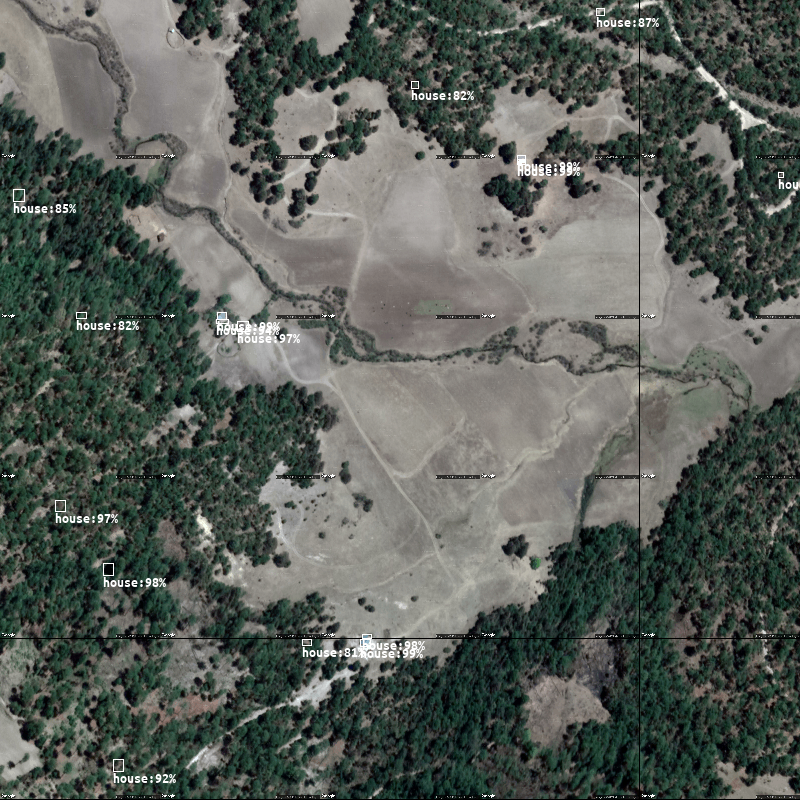

In [31]:
sample = df_group.loc[[0], ['ent', 'mun', 'loc', var]]
print(sample[var])
df_viz = pd.merge(sample, df, how='left', on=['ent', 'mun', 'loc'])
bounds = (df_viz['lon_min'].min(), df_viz['lat_min'].min(),
          df_viz['lon_max'].max(), df_viz['lat_max'].max())
r.plot(bounds=bounds, width=800, height=800, mode='ann', cfg=cfg)
r.output

10    0.0
Name: VPH_PISODT, dtype: float64


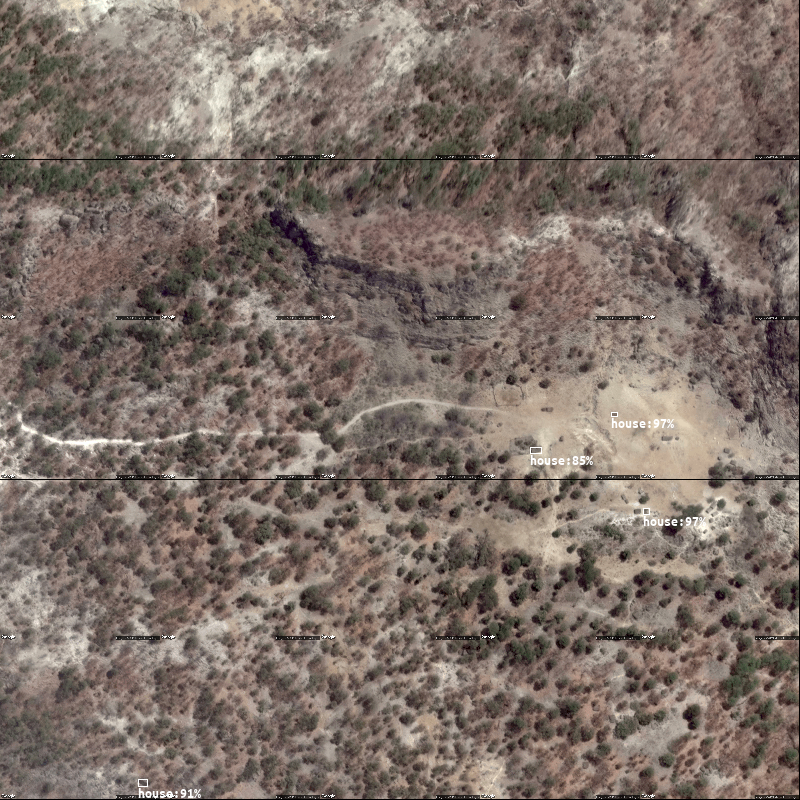

In [32]:
sample = df_group.loc[[10], ['ent', 'mun', 'loc', var]]
print(sample[var])
df_viz = pd.merge(sample, df, how='left', on=['ent', 'mun', 'loc'])
bounds = (df_viz['lon_min'].min(), df_viz['lat_min'].min(),
          df_viz['lon_max'].max(), df_viz['lat_max'].max())
r.plot(bounds=bounds, width=800, height=800, mode='ann', cfg=cfg)
r.output

20    0.166667
Name: VPH_PISODT, dtype: float64


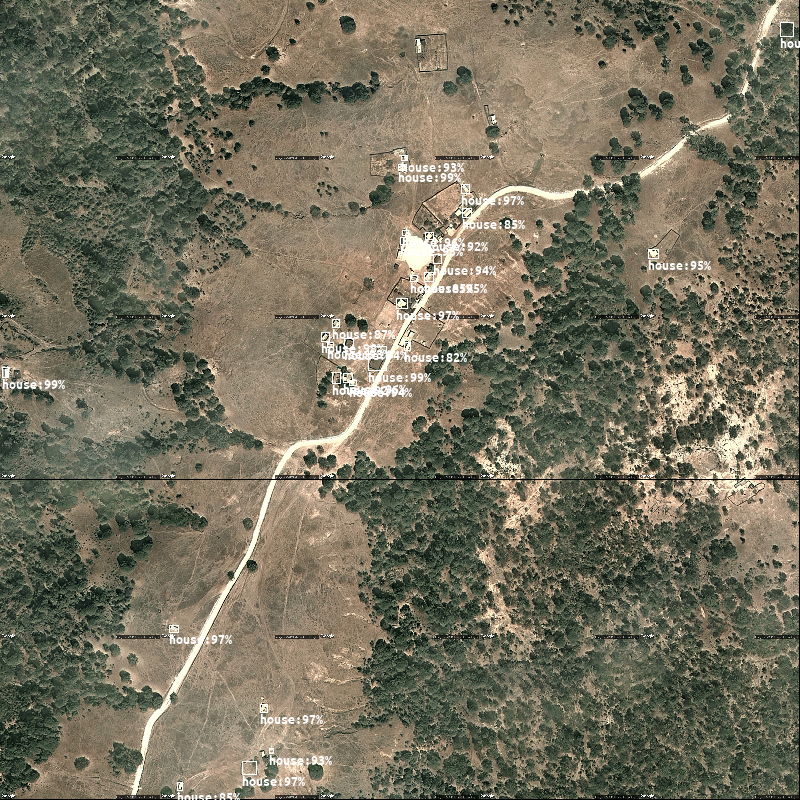

In [33]:
sample = df_group.loc[[20], ['ent', 'mun', 'loc', var]]
print(sample[var])
df_viz = pd.merge(sample, df, how='left', on=['ent', 'mun', 'loc'])
bounds = (df_viz['lon_min'].min(), df_viz['lat_min'].min(),
          df_viz['lon_max'].max(), df_viz['lat_max'].max())
r.plot(bounds=bounds, width=800, height=800, mode='ann', cfg=cfg)
r.output

30    0.333333
Name: VPH_PISODT, dtype: float64


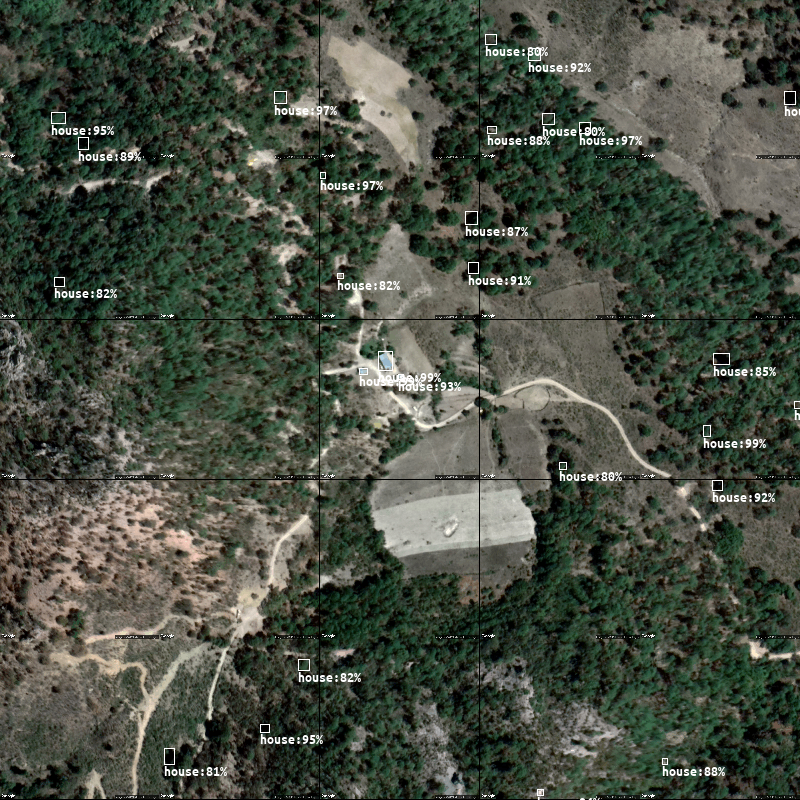

In [42]:
sample = df_group.loc[[30], ['ent', 'mun', 'loc', var]]
print(sample[var])
df_viz = pd.merge(sample, df, how='left', on=['ent', 'mun', 'loc'])
bounds = (df_viz['lon_min'].min(), df_viz['lat_min'].min(),
          df_viz['lon_max'].max(), df_viz['lat_max'].max())
r.plot(bounds=bounds, width=800, height=800, mode='ann', cfg=cfg)
r.output

80    0.75
Name: VPH_PISODT, dtype: float64


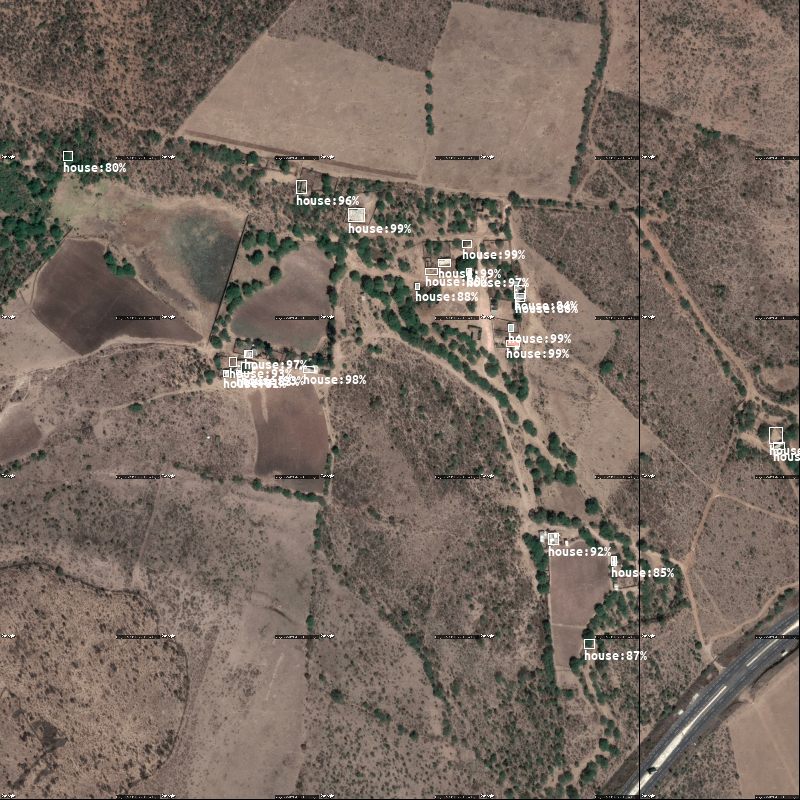

In [35]:
sample = df_group.loc[[80], ['ent', 'mun', 'loc', var]]
print(sample[var])
df_viz = pd.merge(sample, df, how='left', on=['ent', 'mun', 'loc'])
bounds = (df_viz['lon_min'].min(), df_viz['lat_min'].min(),
          df_viz['lon_max'].max(), df_viz['lat_max'].max())
r.plot(bounds=bounds, width=800, height=800, mode='ann', cfg=cfg)
r.output

100    0.829787
Name: VPH_PISODT, dtype: float64


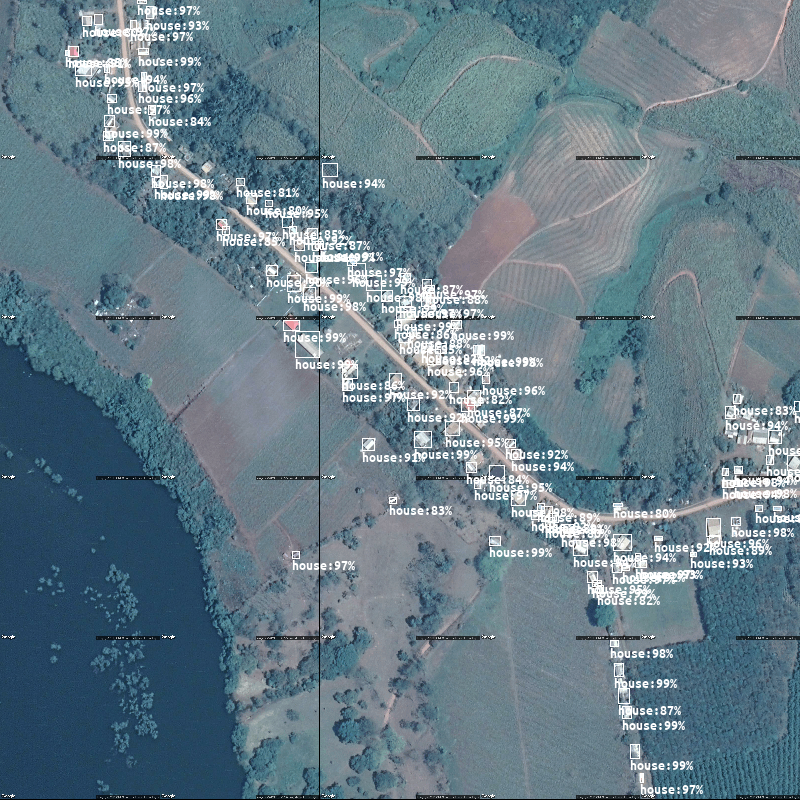

In [36]:
sample = df_group.loc[[100], ['ent', 'mun', 'loc', var]]
print(sample[var])
df_viz = pd.merge(sample, df, how='left', on=['ent', 'mun', 'loc'])
bounds = (df_viz['lon_min'].min(), df_viz['lat_min'].min(),
          df_viz['lon_max'].max(), df_viz['lat_max'].max())
r.plot(bounds=bounds, width=800, height=800, mode='ann', cfg=cfg)
r.output

120    0.890244
Name: VPH_PISODT, dtype: float64


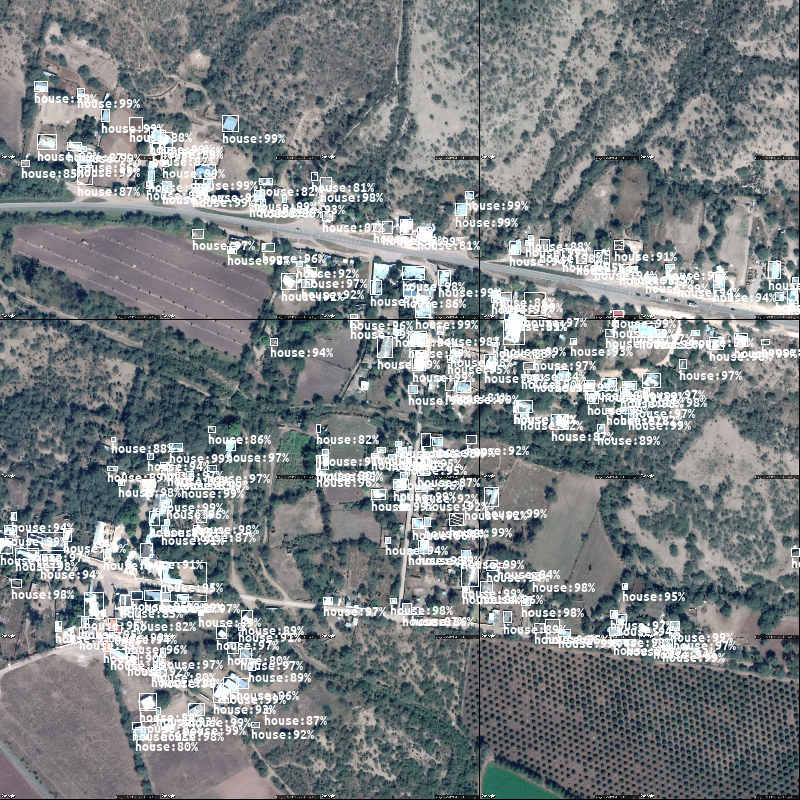

In [37]:
sample = df_group.loc[[120], ['ent', 'mun', 'loc', var]]
print(sample[var])
df_viz = pd.merge(sample, df, how='left', on=['ent', 'mun', 'loc'])
bounds = (df_viz['lon_min'].min(), df_viz['lat_min'].min(),
          df_viz['lon_max'].max(), df_viz['lat_max'].max())
r.plot(bounds=bounds, width=800, height=800, mode='ann', cfg=cfg)
r.output

130    0.923077
Name: VPH_PISODT, dtype: float64


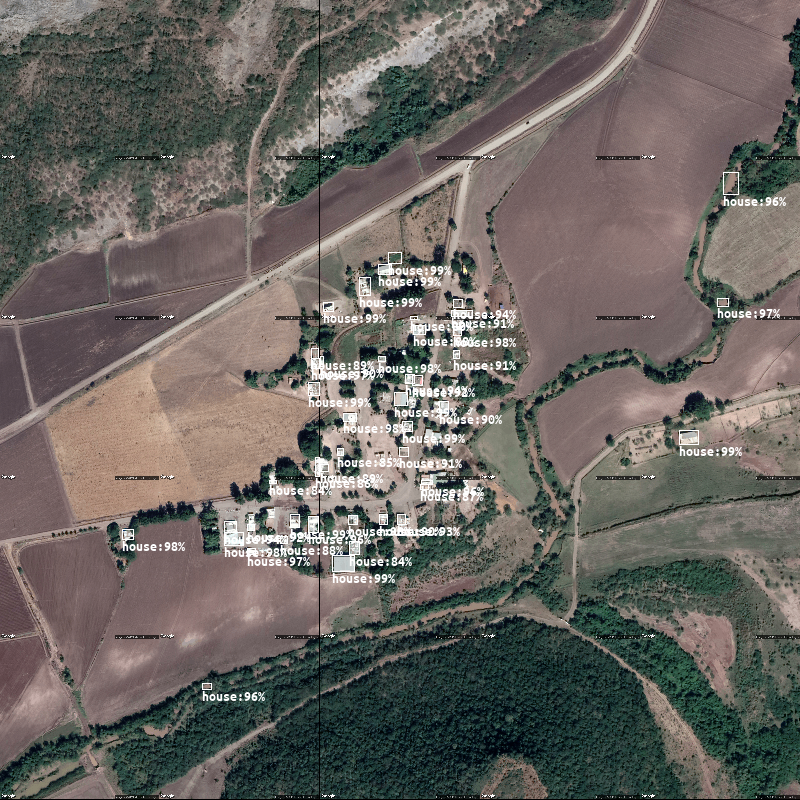

In [38]:
sample = df_group.loc[[130], ['ent', 'mun', 'loc', var]]
print(sample[var])
df_viz = pd.merge(sample, df, how='left', on=['ent', 'mun', 'loc'])
bounds = (df_viz['lon_min'].min(), df_viz['lat_min'].min(),
          df_viz['lon_max'].max(), df_viz['lat_max'].max())
r.plot(bounds=bounds, width=800, height=800, mode='ann', cfg=cfg)
r.output

150    0.965937
Name: VPH_PISODT, dtype: float64


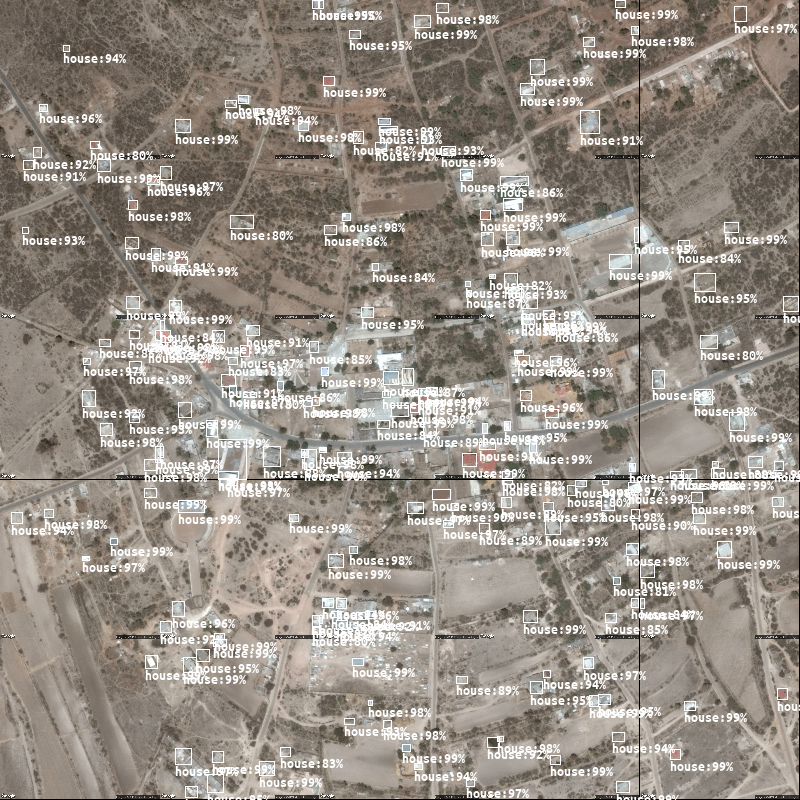

In [39]:
sample = df_group.loc[[150], ['ent', 'mun', 'loc', var]]
print(sample[var])
df_viz = pd.merge(sample, df, how='left', on=['ent', 'mun', 'loc'])
bounds = (df_viz['lon_min'].min(), df_viz['lat_min'].min(),
          df_viz['lon_max'].max(), df_viz['lat_max'].max())
r.plot(bounds=bounds, width=800, height=800, mode='ann', cfg=cfg)
r.output

180    1.0
Name: VPH_PISODT, dtype: float64


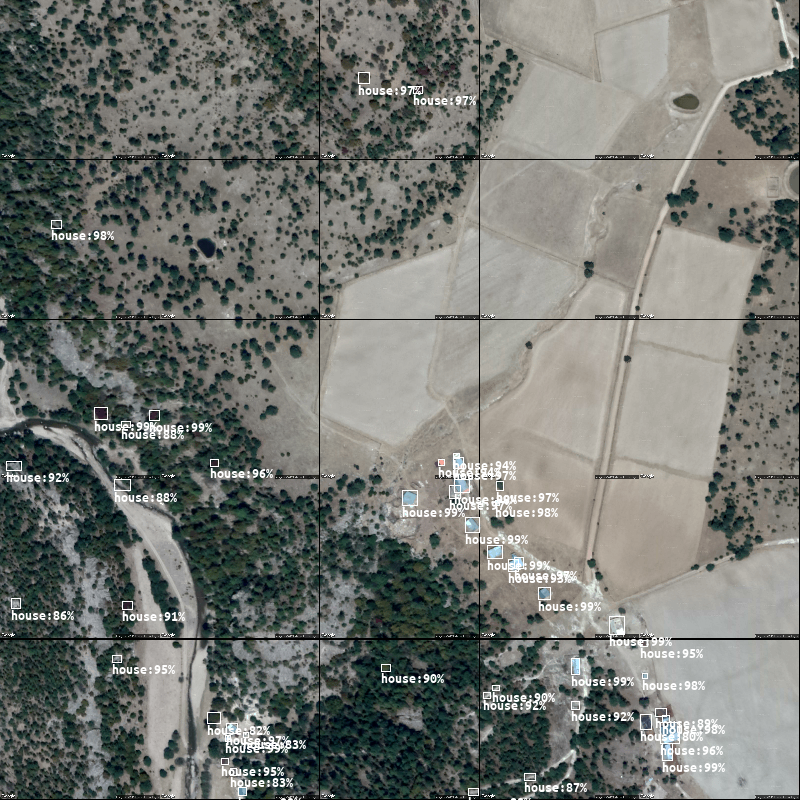

In [40]:
sample = df_group.loc[[180], ['ent', 'mun', 'loc', var]]
print(sample[var])
df_viz = pd.merge(sample, df, how='left', on=['ent', 'mun', 'loc'])
bounds = (df_viz['lon_min'].min(), df_viz['lat_min'].min(),
          df_viz['lon_max'].max(), df_viz['lat_max'].max())
r.plot(bounds=bounds, width=800, height=800, mode='ann', cfg=cfg)
r.output